<a href="https://colab.research.google.com/github/AfrifaEben7/ViT_part/blob/master/fine_tune.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install roboflow

from roboflow import Roboflow
import os

rf = Roboflow(api_key="eCmKTW2qAhPqgU8vXej8")
project = rf.workspace("ebenezer-klxtj").project("microphage-quwej")
version = project.version(4)
dataset = version.download("sam2")

# from google.colab import drive
# drive.mount('/content/drive')

# rename dataset.location to "data"
os.rename(dataset.location, "/content/data")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.8/95.8 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 39.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 82.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 100.3 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.13.0.92
    Uninstalling opencv-python-headless-4.13.0.92:
      Successfully uninstalled opencv-python-headless-4.13.0.92
  Attempting uninstall: idna
    Found existing installation: idna 3.11
    Uninstalling idna-3.11:
      Successfully uninstalled idna-3.11
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to microphage-4 in sam2:: 100%|██████████| 709/709 [00:00<00:00, 8925.85it/s]


In [ ]:
!git clone https://github.com/facebookresearch/sam2.git

Cloning into 'sam2'...
remote: Enumerating objects: 1070, done.
remote: Total 1070 (delta 0), reused 0 (delta 0), pack-reused 1070 (from 1)
Receiving objects: 100% (1070/1070), 128.11 MiB | 19.90 MiB/s, done.
Resolving deltas: 100% (381/381), done.


In [ ]:
!wget -O /content/sam2/sam2/configs/train.yaml 'https://drive.usercontent.google.com/download?id=11cmbxPPsYqFyWq87tmLgBAQ6OZgEhPG3'

--2025-08-16 23:13:24--  https://drive.usercontent.google.com/download?id=11cmbxPPsYqFyWq87tmLgBAQ6OZgEhPG3
Resolving drive.usercontent.google.com (drive.usercontent.google.com)... 142.250.141.132, 2607:f8b0:4023:c0b::84
Connecting to drive.usercontent.google.com (drive.usercontent.google.com)|142.250.141.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 11055 (11K) [application/octet-stream]
Saving to: ‘/content/sam2/sam2/configs/train.yaml’

/content/sam2/sam2/ 100%[===================>]  10.80K  --.-KB/s    in 0s      

2025-08-16 23:13:25 (85.1 MB/s) - ‘/content/sam2/sam2/configs/train.yaml’ saved [11055/11055]



In [ ]:
%cd /content/sam2

/content/sam2


Next, we are going to install SAM-2.

The SAM-2 installation process may take several minutes.

In [ ]:
!pip install -e .[dev] -q

  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 2.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.6/74.6 kB 4.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 5.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 44.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 16.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.5/75.5 kB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 427.5/427.5 kB 39.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 109.4 MB/s eta 0

In [ ]:
!cd ./checkpoints && ./download_ckpts.sh

--2025-08-16 23:19:48--  https://dl.fbaipublicfiles.com/segment_anything_2/092824/sam2.1_hiera_tiny.pt
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 18.154.144.87, 18.154.144.13, 18.154.144.74, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|18.154.144.87|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 156008466 (149M) [application/vnd.snesdev-page-table]
Saving to: ‘sam2.1_hiera_tiny.pt’

sam2.1_hiera_tiny.p 100%[===================>] 148.78M   357MB/s    in 0.4s    

2025-08-16 23:19:48 (357 MB/s) - ‘sam2.1_hiera_tiny.pt’ saved [156008466/156008466]

--2025-08-16 23:19:48--  https://dl.fbaipublicfiles.com/segment_anything_2/092824/sam2.1_hiera_small.pt
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 18.154.144.87, 18.154.144.13, 18.154.144.74, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|18.154.144.87|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 184416285 (176M) [

## Modify Dataset File Names

SAM-2.1 requires dataset file names to be in a particular format. Run the code snippet below to format your dataset file names as required.

In [ ]:
# Script to rename roboflow filenames to something SAM 2.1 compatible.
# Maybe it is possible to remove this step tweaking sam2/sam2/configs/train.yaml.
import os
import re

FOLDER = "/content/data/train"

for filename in os.listdir(FOLDER):
    # Replace all except last dot with underscore
    new_filename = filename.replace(".", "_", filename.count(".") - 1)
    if not re.search(r"_\d+\.\w+$", new_filename):
        # Add an int to the end of base name
        new_filename = new_filename.replace(".", "_1.")
    os.rename(os.path.join(FOLDER, filename), os.path.join(FOLDER, new_filename))

## Start Training

You can now start training a SAM-2.1 model. The amount of time it will take to train the model will vary depending on the GPU you are using and the number of images in your dataset.

For the car part dataset of 38 images, training on an A100 GPU takes ~15 minutes.

In [ ]:
!python training/train.py -c 'configs/train.yaml' --use-cluster 0 --num-gpus 1

###################### Train App Config ####################
scratch:
  resolution: 1024
  train_batch_size: 1
  num_train_workers: 10
  num_frames: 1
  max_num_objects: 3
  base_lr: 5.0e-06
  vision_lr: 3.0e-06
  phases_per_epoch: 1
  num_epochs: 40
dataset:
  img_folder: /content/data/train
  gt_folder: /content/data/train
  multiplier: 2
vos:
  train_transforms:
  - _target_: training.dataset.transforms.ComposeAPI
    transforms:
    - _target_: training.dataset.transforms.RandomHorizontalFlip
      consistent_transform: true
    - _target_: training.dataset.transforms.RandomAffine
      degrees: 25
      shear: 20
      image_interpolation: bilinear
      consistent_transform: true
    - _target_: training.dataset.transforms.RandomResizeAPI
      sizes: ${scratch.resolution}
      square: true
      consistent_transform: true
    - _target_: training.dataset.transforms.ColorJitter
      consistent_transform: true
      brightness: 0.1
      contrast: 0.03
      saturation: 0.03
   

You can visualize the model training graphs with Tensorboard:

In [ ]:
%load_ext tensorboard
%tensorboard --bind_all --logdir ./sam2_logs/

<IPython.core.display.Javascript object>

## Visualize Model Results

With a trained model ready, we can test the model on an image from our test set.

To assist with visualizing model predictions, we are going to use Roboflow supervision, an open source computer vision Python package with utilities for working with vision model outputs


In [ ]:
!pip install supervision -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.2/207.2 kB 5.6 MB/s eta 0:00:00


### Load SAM-2.1

In [ ]:
import torch
from sam2.build_sam import build_sam2
from sam2.automatic_mask_generator import SAM2AutomaticMaskGenerator
import supervision as sv
import os
import random
from PIL import Image
import numpy as np

# use bfloat16 for the entire notebook
# from Meta notebook
torch.autocast("cuda", dtype=torch.bfloat16).__enter__()
if torch.cuda.get_device_properties(0).major >= 8:
    torch.backends.cuda.matmul.allow_tf32 = True
    torch.backends.cudnn.allow_tf32 = True

checkpoint = "/content/sam2/sam2_logs/configs/train.yaml/checkpoints/checkpoint.pt"



model_cfg = "configs/sam2.1/sam2.1_hiera_b+.yaml"
sam2 = build_sam2(model_cfg, checkpoint, device="cuda")
mask_generator = SAM2AutomaticMaskGenerator(sam2)

checkpoint_base = "/content/sam2/checkpoints/sam2.1_hiera_base_plus.pt"
model_cfg_base = "configs/sam2.1/sam2.1_hiera_b+.yaml"
sam2_base = build_sam2(model_cfg_base, checkpoint_base, device="cuda")
mask_generator_base = SAM2AutomaticMaskGenerator(sam2_base)

### Run Inference on an Image in Automatic Mask Generation Mode

In [ ]:
output_folder = "myvid"
tif_file = "Cell_CamB_ch0_stack0000_488nm_0000000msec_0003687647msecAbs_decon.tif"
os.makedirs(output_folder, exist_ok=True)

stack = tifffile.imread(tif_file)
print("Original shape:", stack.shape)

# Remove singleton dimensions (reshape to [Z, Y, X])
stack = np.squeeze(stack)
while stack.ndim > 3:
    stack = np.squeeze(stack, axis=0)
print("Squeezed shape:", stack.shape)  # Expect (Z, H, W)

# === STEP 2: CONVERT TO JPEG ===
for i, slice_img in enumerate(stack):
    # Normalize if not uint8
    if slice_img.dtype != np.uint8:
        min_val = slice_img.min()
        max_val = slice_img.max()
        if max_val - min_val > 0:
            normalized = ((slice_img - min_val) / (max_val - min_val) * 255).astype(np.uint8)
        else:
            normalized = np.zeros_like(slice_img, dtype=np.uint8)
    else:
        normalized = slice_img

    # Convert to image and save
    img = Image.fromarray(normalized)
    img.save(os.path.join(output_folder, f"{i:04d}.jpg"), "JPEG")

print("saved to:", output_folder)


In [ ]:
validation_set = os.listdir("/content/data/valid")

# choose random with .json extension
image = random.choice([img for img in validation_set if img.endswith(".jpg")])
image = os.path.join("/content/data/valid", image)
opened_image = np.array(Image.open(image).convert("RGB"))
result = mask_generator.generate(opened_image)

detections = sv.Detections.from_sam(sam_result=result)

mask_annotator = sv.MaskAnnotator(color_lookup = sv.ColorLookup.INDEX)
annotated_image = opened_image.copy()
annotated_image = mask_annotator.annotate(annotated_image, detections=detections)

base_annotator = sv.MaskAnnotator(color_lookup = sv.ColorLookup.INDEX)

base_result = mask_generator_base.generate(opened_image)
base_detections = sv.Detections.from_sam(sam_result=base_result)
base_annotated_image = opened_image.copy()
base_annotated_image = base_annotator.annotate(base_annotated_image, detections=base_detections)

sv.plot_images_grid(images=[annotated_image, base_annotated_image], titles=["Fine-Tuned", "Base"], grid_size=(1, 2))

In [ ]:
!cp -r /content/sam2/sam2_logs/configs/train.yaml/ /content/drive/MyDrive/CheckPOints/three
# !cp -r /content/drive/MyDrive/video_infer/  /content/

In [ ]:
# from roboflow import Roboflow

# rf = Roboflow(api_key="eCmKTW2qAhPqgU8vXej8")
# workspace = rf.workspace("ebenezer-klxtj")

# workspace.deploy_model(
#   model_type="SAM2",
#   model_path="/content/sam2/sam2_logs/configs/train.yaml/checkpoints/checkpoint.pt",
#   project_ids=["biomed-lgc2n"],
#   model_name="sam2_custom_model"
# )

Loaded 270 frames from video
Using 90 frames out of 270 with skip_frames=3
Temporary frames directory: /tmp/tmpw_947gvc


Saving frames as JPEG:   0%|          | 0/90 [00:00<?, ?it/s]

Generating masks for frame 30...
Found 3 masks and 3 points


frame loading (JPEG): 100%|██████████| 90/90 [00:02<00:00, 34.93it/s]


Propagating segmentations through video...


Processing frames:   0%|          | 0/90 [00:00<?, ?it/s]


propagate in video: 100%|██████████| 60/60 [01:02<00:00,  1.04s/it]


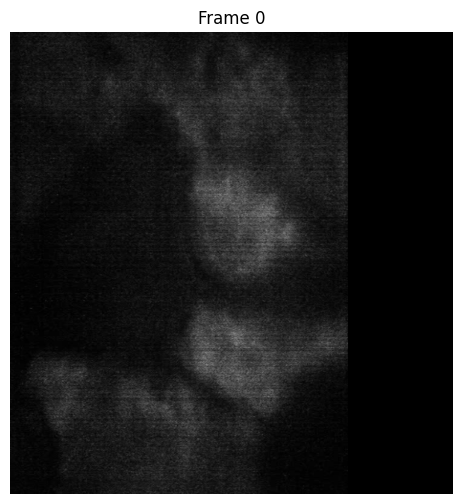

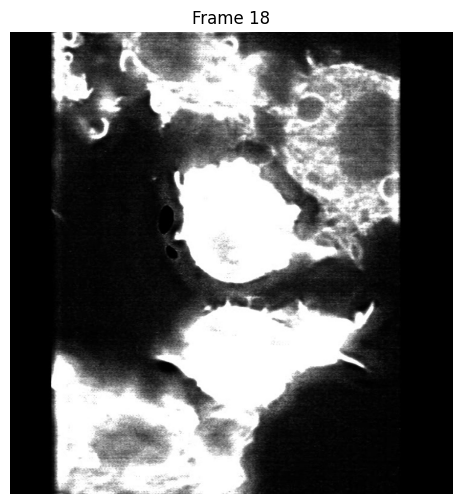

Error during tracking: too many values to unpack (expected 2)
Falling back to static masks


Saving video:   0%|          | 0/90 [00:00<?, ?it/s]

Video saved to /content/output/macrophage_tracking_bw.mp4
Video saved to: /content/output/macrophage_tracking_bw.mp4


Cleaning up temporary directory: /tmp/tmpw_947gvc


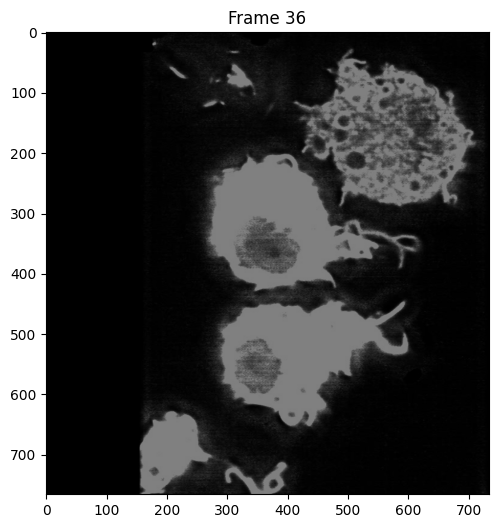

In [ ]:
import os
import sys
import torch
import numpy as np
import cv2
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
from PIL import Image
from IPython.display import display, HTML
from base64 import b64encode
import tempfile
import shutil

# Add the SAM-2.1 directory to the path to ensure imports work correctly
sam2_path = os.path.abspath("/content/sam2")
if sam2_path not in sys.path:
    sys.path.append(sam2_path)

# Import SAM-2.1 modules
from sam2.build_sam import build_sam2, build_sam2_video_predictor
from sam2.automatic_mask_generator import SAM2AutomaticMaskGenerator

# Clear CUDA memory cache
def clear_cuda_memory():
    """Clear CUDA memory cache."""
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
        import gc
        gc.collect()

# Function to load a video
def load_video(video_path):
    """Load a video into frames format."""
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        raise ValueError(f"Could not open video file: {video_path}")

    frames = []
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break
        # Convert to RGB
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frames.append(frame)

    cap.release()
    print(f"Loaded {len(frames)} frames from video")
    return frames

# Function to save frames as JPEG files
def save_frames_as_jpeg(frames, output_dir):
    """Save frames as JPEG files with numeric filenames."""
    os.makedirs(output_dir, exist_ok=True)

    for i, frame in enumerate(tqdm(frames, desc="Saving frames as JPEG")):
        frame_path = os.path.join(output_dir, f"{i}.jpg")
        cv2.imwrite(frame_path, cv2.cvtColor(frame, cv2.COLOR_RGB2BGR))

    return output_dir

# Function to save processed frames as a video
def save_video(frames, output_path, fps=30):
    """Save frames as a video."""
    if not frames:
        print("No frames to save")
        return

    h, w = frames[0].shape[:2]
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_path, fourcc, fps, (w, h))

    for frame in tqdm(frames, desc="Saving video"):
        frame_bgr = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)
        out.write(frame_bgr)

    out.release()
    print(f"Video saved to {output_path}")

# Function to display a video in the notebook
def display_video(video_path):
    """Display a video in the notebook."""
    video_file = open(video_path, "rb").read()
    video_url = f"data:video/mp4;base64,{b64encode(video_file).decode()}"
    return HTML(f"""
    <video width="640" height="480" controls>
        <source src="{video_url}" type="video/mp4">
    </video>
    """)

# Function to generate masks and extract points
def generate_masks_and_points(frame, mask_generator, min_area=100, max_objects=3):
    """Generate masks using SAM-2.1 and extract center points."""
    # Generate masks
    masks = mask_generator.generate(frame)

    # Sort by area and filter
    masks = sorted(masks, key=lambda x: x['area'], reverse=True)
    masks = [mask for mask in masks if mask['area'] > min_area]

    # Limit number of objects
    if len(masks) > max_objects:
        masks = masks[:max_objects]

    # Extract center points
    points = []
    for mask in masks:
        segmentation = mask['segmentation']
        y_indices, x_indices = np.where(segmentation)
        if len(y_indices) > 0 and len(x_indices) > 0:
            x_center = int(np.mean(x_indices))
            y_center = int(np.mean(y_indices))
            points.append([x_center, y_center])

    # All foreground points
    point_labels = [1] * len(points)

    return masks, points, point_labels

# Function to show a mask on a plot
def show_mask(mask, ax, color=None, obj_id=None):
    """Show a mask on a matplotlib axes."""
    if color is None:
        color = np.array([1, 1, 1])  # White mask

    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image, alpha=0.5)

    if obj_id is not None:
        # Find center of mask
        y_indices, x_indices = np.where(mask)
        if len(y_indices) > 0:
            y_center = int(np.mean(y_indices))
            x_center = int(np.mean(x_indices))
            ax.text(x_center, y_center, f"ID:{obj_id}",
                    color='white', fontsize=12,
                    ha='center', va='center',
                    bbox=dict(facecolor='black', alpha=0.5, boxstyle='round'))

# Function to create a black and white image from masks
def create_bw_frame(frame, frame_masks):
    """Create a black and white frame with white objects on black background."""
    h, w = frame.shape[:2]
    black_frame = np.zeros((h, w, 3), dtype=np.uint8)

    if not frame_masks:
        return black_frame

    # Combine all masks
    combined_mask = np.zeros((h, w), dtype=bool)
    for mask in frame_masks.values():
        # Skip if dimensions don't match
        if mask.shape[0] != h or mask.shape[1] != w:
            continue
        combined_mask = np.logical_or(combined_mask, mask)

    # Set white pixels
    black_frame[combined_mask] = [255, 255, 255]

    return black_frame

# Track objects in a video and create a black and white visualization
def track_macrophages_dict_bw(video_path, checkpoint_path, skip_frames=3, frame_idx=0,
                             min_area=100, max_objects=3, output_path=None):
    """
    Track objects in a video using dictionary storage pattern for segmentation results.

    Args:
        video_path: Path to the video file
        checkpoint_path: Path to your fine-tuned SAM-2.1 checkpoint
        skip_frames: Process every Nth frame to reduce memory usage
        frame_idx: Frame index to start segmentation
        min_area: Minimum area for masks
        max_objects: Maximum number of objects to track
        output_path: Path to save the output video

    Returns:
        Path to the output video
    """
    # Configure CUDA
    torch.autocast("cuda", dtype=torch.bfloat16).__enter__()
    if torch.cuda.is_available() and torch.cuda.get_device_properties(0).major >= 8:
        torch.backends.cuda.matmul.allow_tf32 = True
        torch.backends.cudnn.allow_tf32 = True

    # Clear memory before starting
    clear_cuda_memory()

    # Load the model
    model_cfg = "configs/sam2.1/sam2.1_hiera_b+.yaml"
    sam2 = build_sam2(model_cfg, checkpoint_path, device="cuda")
    mask_generator = SAM2AutomaticMaskGenerator(sam2)
    predictor = build_sam2_video_predictor(model_cfg, checkpoint_path, device="cuda")

    # Load and sample frames
    all_frames = load_video(video_path)
    frames = all_frames[::skip_frames]
    print(f"Using {len(frames)} frames out of {len(all_frames)} with skip_frames={skip_frames}")

    # Create output directory
    if output_path:
        output_dir = os.path.dirname(output_path)
        os.makedirs(output_dir, exist_ok=True)

    # Create a temporary directory for frames
    temp_frames_dir = tempfile.mkdtemp()
    print(f"Temporary frames directory: {temp_frames_dir}")

    try:
        # Save frames as JPEG
        jpeg_frames_dir = save_frames_as_jpeg(frames, temp_frames_dir)

        # Clear memory
        clear_cuda_memory()

        # Generate masks for the selected frame
        print(f"Generating masks for frame {frame_idx}...")
        first_frame = frames[frame_idx]
        masks, points, point_labels = generate_masks_and_points(
            first_frame, mask_generator, min_area, max_objects
        )

        print(f"Found {len(masks)} masks and {len(points)} points")

        # If no points found, exit
        if len(points) == 0:
            print("No objects detected. Adjust min_area parameter.")
            return None

        # Convert points and labels to tensors
        points_tensor = torch.tensor(points, dtype=torch.float32, device="cuda")
        point_labels_tensor = torch.tensor(point_labels, dtype=torch.int64, device="cuda")

        # Initialize the segmentation state
        try:
            with torch.inference_mode(), torch.autocast("cuda", dtype=torch.bfloat16):
                # Initialize state with the frames
                inference_state = predictor.init_state(jpeg_frames_dir)

                # Add points to the first frame
                for i, (point, label) in enumerate(zip(points, point_labels)):
                    if i >= max_objects:
                        break

                    # Create single-point tensors
                    point_tensor = torch.tensor([point], dtype=torch.float32, device="cuda")
                    label_tensor = torch.tensor([label], dtype=torch.int64, device="cuda")

                    # Add the point
                    predictor.add_new_points(
                        inference_state=inference_state,
                        frame_idx=frame_idx,
                        obj_id=i,  # Using index as object ID
                        points=point_tensor,
                        labels=label_tensor
                    )

                # Store segmentation results for each frame
                video_segments = {}  # Dictionary to store per-frame segmentation results

                # Propagate segmentations through the video
                print("Propagating segmentations through video...")
                for out_frame_idx, out_obj_ids, out_mask_logits in tqdm(
                        predictor.propagate_in_video(inference_state),
                        total=len(frames),
                        desc="Processing frames"
                    ):

                    # Store binary masks for this frame
                    video_segments[out_frame_idx] = {
                        out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
                        for i, out_obj_id in enumerate(out_obj_ids)
                    }

                    # Clean up CUDA memory
                    if out_frame_idx % 10 == 0:
                        clear_cuda_memory()

                # Show sample segmentations
                vis_frame_stride = max(1, len(frames) // 5)  # Show 5 frames
                plt.close("all")
                for out_frame_idx in range(0, len(frames), vis_frame_stride):
                    plt.figure(figsize=(8, 6))
                    plt.title(f"Frame {out_frame_idx}")
                    plt.imshow(frames[out_frame_idx])
                    if out_frame_idx in video_segments:
                        for out_obj_id, out_mask in video_segments[out_frame_idx].items():
                            show_mask(out_mask, plt.gca(), obj_id=out_obj_id)
                    plt.axis('off')
                    plt.show()

                # Create black and white frames for the video
                print("Creating black and white video frames...")
                processed_frames = []
                for i in range(len(frames)):
                    if i in video_segments:
                        # Create black and white frame
                        bw_frame = create_bw_frame(frames[i], video_segments[i])
                        processed_frames.append(bw_frame)
                    else:
                        # Black frame for frames without segmentation
                        processed_frames.append(np.zeros_like(frames[0]))

        except Exception as e:
            print(f"Error during tracking: {e}")
            # Fallback: just show the masks from the first frame
            print("Falling back to static masks")

            processed_frames = []
            for frame in frames:
                # Create a black background
                bw_frame = np.zeros_like(frame)

                # Apply first frame masks to all frames
                for mask in masks:
                    bw_frame[mask['segmentation']] = [255, 255, 255]

                processed_frames.append(bw_frame)

        # Save the video
        if output_path:
            save_video(processed_frames, output_path)
            print(f"Video saved to: {output_path}")

            # Display video
            display(display_video(output_path))

        return output_path

    finally:
        # Clean up temporary directory
        print(f"Cleaning up temporary directory: {temp_frames_dir}")
        shutil.rmtree(temp_frames_dir)
        clear_cuda_memory()


checkpoint_path = "/content/sam2/sam2_logs/configs/train.yaml/checkpoints/checkpoint.pt"
video_path = "/content/cell2_CamB_ch0_stack0003.mp4"
output_path = "/content/output/macrophage_tracking_bw.mp4"

result_path = track_macrophages_dict_bw(
    video_path=video_path,
    checkpoint_path=checkpoint_path,
    skip_frames=3,           # Process every 3rd frame to save memory
    frame_idx=30,            # Frame to use for initial segmentation
    min_area=100,            # Minimum area for objects to track
    max_objects=3,           # Maximum number of objects to track
    output_path=output_path
)

Loading SAM-2.1 model from /content/sam2/sam2_logs/configs/train.yaml/checkpoints/checkpoint.pt
Loaded 270 frames from video
Processing 54 frames out of 270 with skip_frames=5


Processing frames:   0%|          | 0/54 [00:00<?, ?it/s]

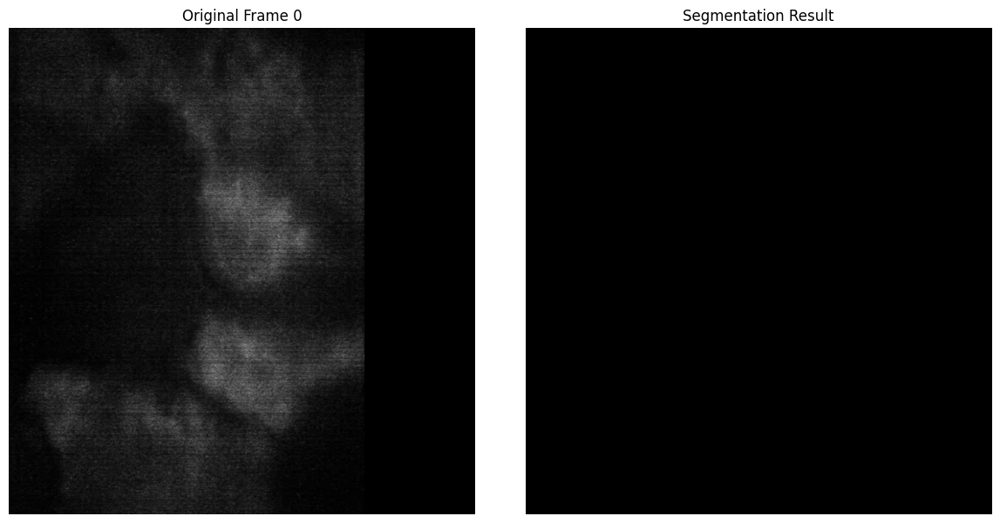

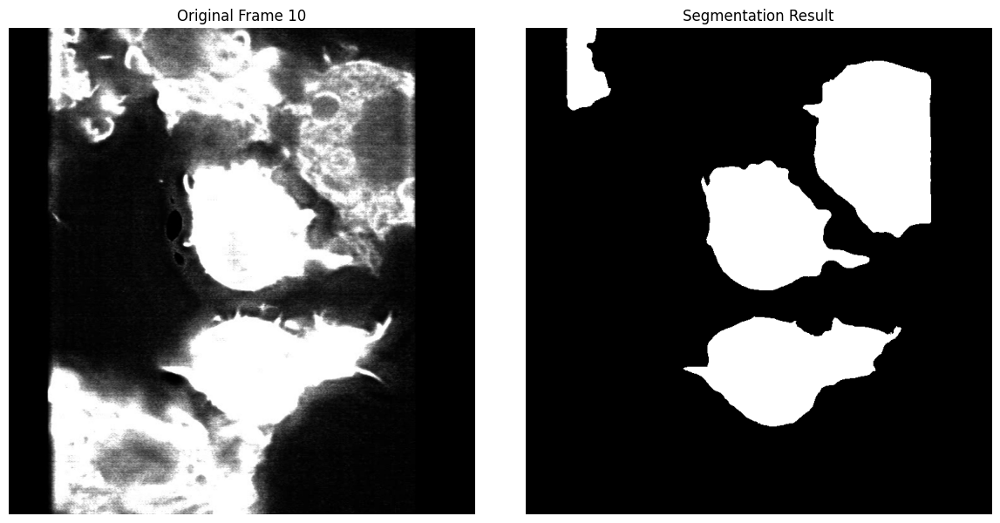

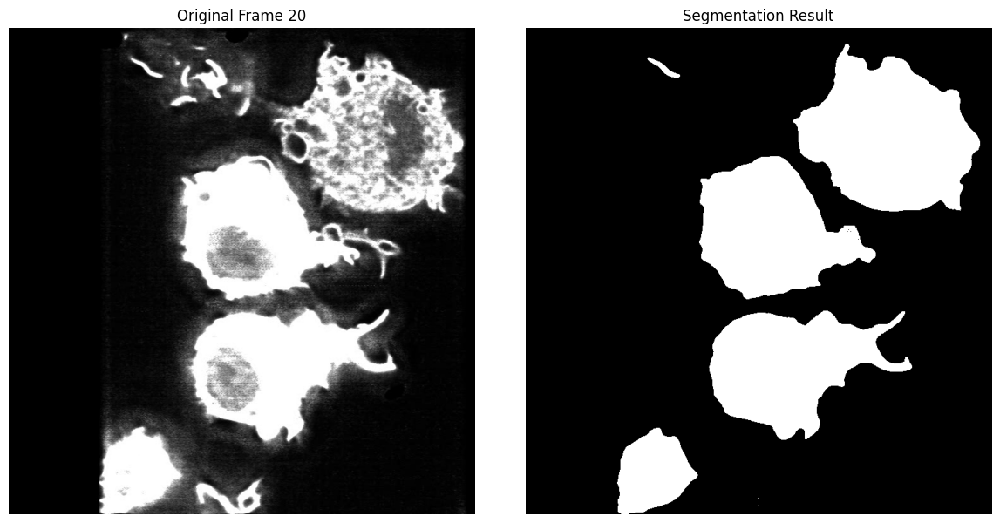

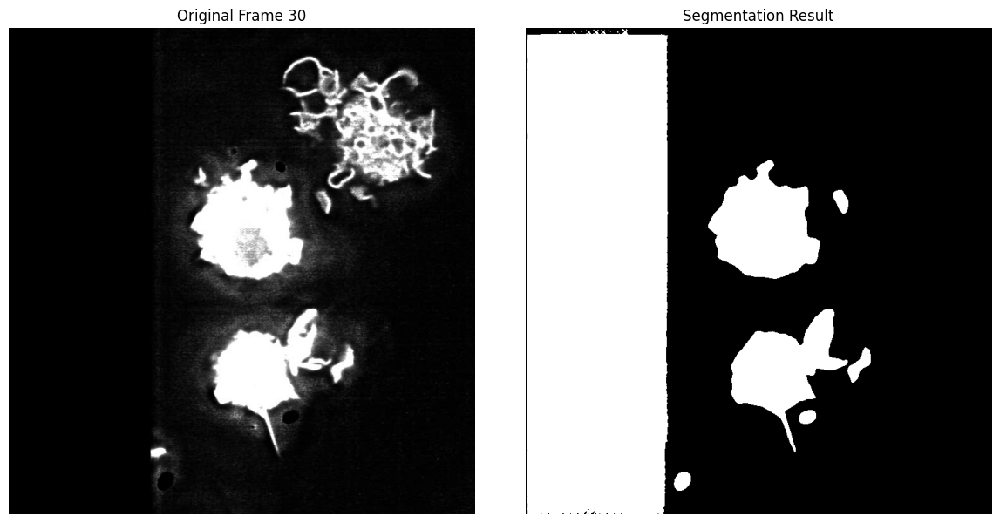

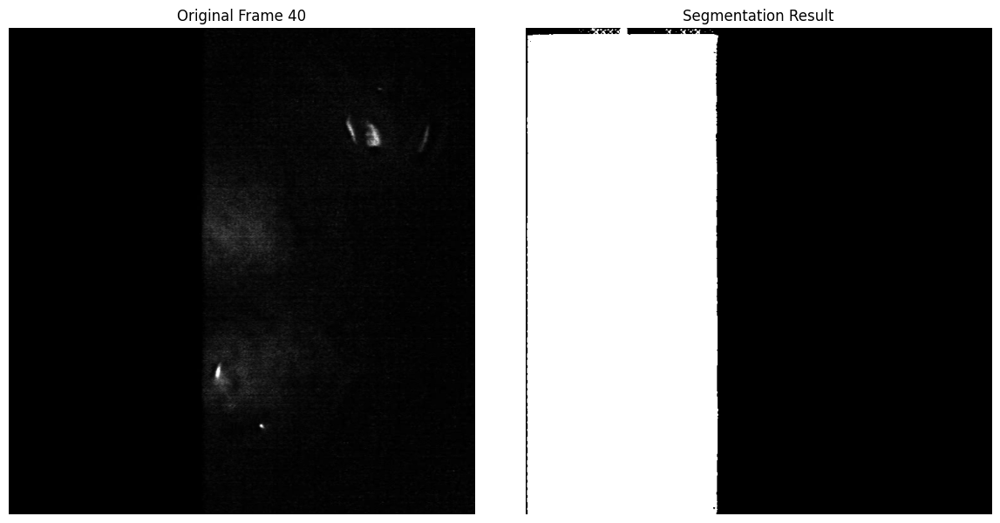

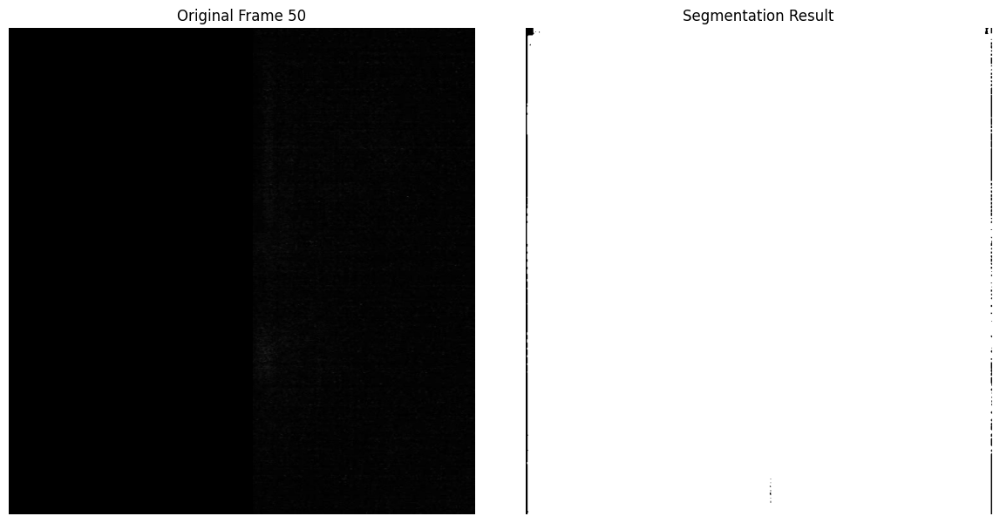

Saving video:   0%|          | 0/54 [00:00<?, ?it/s]

Video saved to /content/output/segmentation_bw.mp4
Video saved to: /content/output/segmentation_bw.mp4


In [ ]:
import os
import sys
import torch
import numpy as np
import cv2
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
from PIL import Image
from IPython.display import display, HTML
from base64 import b64encode

# Add the SAM-2.1 directory to the path to ensure imports work correctly
sam2_path = os.path.abspath("/content/sam2")
if sam2_path not in sys.path:
    sys.path.append(sam2_path)

# # Import SAM-2.1 modules
# from sam2.build_sam import build_sam2
# from sam2.automatic_mask_generator import SAM2AutomaticMaskGenerator

# Clear CUDA memory cache
def clear_cuda_memory():
    """Clear CUDA memory cache."""
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
        import gc
        gc.collect()

# Function to load a video
def load_video(video_path):
    """Load a video into frames format."""
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        raise ValueError(f"Could not open video file: {video_path}")

    frames = []
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break
        # Convert to RGB
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frames.append(frame)

    cap.release()
    print(f"Loaded {len(frames)} frames from video")
    return frames

# Function to save processed frames as a video
def save_video(frames, output_path, fps=30):
    """Save frames as a video."""
    if not frames:
        print("No frames to save")
        return

    h, w = frames[0].shape[:2]
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_path, fourcc, fps, (w, h))

    for frame in tqdm(frames, desc="Saving video"):
        frame_bgr = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)
        out.write(frame_bgr)

    out.release()
    print(f"Video saved to {output_path}")

# Function to display a video in the notebook
def display_video(video_path):
    """Display a video in the notebook."""
    video_file = open(video_path, "rb").read()
    video_url = f"data:video/mp4;base64,{b64encode(video_file).decode()}"
    return HTML(f"""
    <video width="640" height="480" controls>
        <source src="{video_url}" type="video/mp4">
    </video>
    """)

# Function to create a black and white mask from segmentation
def create_bw_mask(frame, masks, min_area=100):

    h, w = frame.shape[:2]
    bw_frame = np.zeros((h, w, 3), dtype=np.uint8)

    # Filter masks by area
    filtered_masks = [mask for mask in masks if mask['area'] > min_area]

    # Apply all masks
    for mask in filtered_masks:
        bw_frame[mask['segmentation']] = [255, 255, 255]

    return bw_frame

# Function to process video with frame-by-frame segmentation
def segment_video_frames(video_path, checkpoint_path, skip_frames=5,
                         min_area=100, output_path=None, sample_frames=False):

    # Configure CUDA
    torch.autocast("cuda", dtype=torch.bfloat16).__enter__()
    if torch.cuda.is_available() and torch.cuda.get_device_properties(0).major >= 8:
        torch.backends.cuda.matmul.allow_tf32 = True
        torch.backends.cudnn.allow_tf32 = True

    # Clear memory
    clear_cuda_memory()

    # Load the model
    print(f"Loading SAM-2.1 model from {checkpoint_path}")
    model_cfg = "configs/sam2.1/sam2.1_hiera_b+.yaml"
    sam2 = build_sam2(model_cfg, checkpoint_path, device="cuda")
    mask_generator = SAM2AutomaticMaskGenerator(sam2)

    # Load video frames
    all_frames = load_video(video_path)

    # Apply frame skipping
    frames = all_frames[::skip_frames]
    print(f"Processing {len(frames)} frames out of {len(all_frames)} with skip_frames={skip_frames}")

    # Create output directory if needed
    if output_path:
        os.makedirs(os.path.dirname(output_path), exist_ok=True)

    # Process each frame
    processed_frames = []

    for i, frame in enumerate(tqdm(frames, desc="Processing frames")):
        # Generate masks for this frame
        masks = mask_generator.generate(frame)

        # Create black and white frame
        bw_frame = create_bw_mask(frame, masks, min_area)
        processed_frames.append(bw_frame)

        # Show sample frames
        if sample_frames and i % max(1, len(frames) // 5) == 0:
            # Show original frame with segmentation
            plt.figure(figsize=(12, 6))
            plt.subplot(1, 2, 1)
            plt.imshow(frame)
            plt.title(f"Original Frame {i}")
            plt.axis('off')

            # Show black and white result
            plt.subplot(1, 2, 2)
            plt.imshow(bw_frame)
            plt.title(f"Segmentation Result")
            plt.axis('off')

            plt.tight_layout()
            plt.show()

        # Clear memory after each frame
        clear_cuda_memory()

    # Save the video
    if output_path:
        save_video(processed_frames, output_path)
        print(f"Video saved to: {output_path}")

        # Display video
        display(display_video(output_path))

    return output_path

# Example usage:
checkpoint_path = "/content/sam2/sam2_logs/configs/train.yaml/checkpoints/checkpoint.pt"
video_path = "/content/cell2_CamB_ch0_stack0003.mp4"
output_path = "/content/output/segmentation_bw.mp4"

result_path = segment_video_frames(
    video_path=video_path,
    checkpoint_path=checkpoint_path,
    skip_frames=5,
    min_area=100,
    output_path=output_path,
    sample_frames=True
)